# Build multi-spectral seasonal composites with HLS
accessing earthdata through AWS  
script to process HLS composites using s3 access on MAAP:  
https://github.com/lauraduncanson/icesat2_boreal/blob/master/lib/3.1.2_dps.py


In [1]:
!pip install -U -r /projects/Developer/icesat2_boreal/dps/requirements_main.txt
!pip install pystac_client
from platform import python_version
python_version()
import sys
import os
sys.path.append('/projects/icesat2_boreal/lib')
sys.path.append('/projects/Developer/icesat2_boreal/lib')
import ExtractUtils
from pyproj import CRS, Transformer
import geopandas as gpd
import maplib_folium
import pandas as pd

import numpy as np
import rasterio
from rasterio.plot import show
from rasterio.plot import show_hist

%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import contextily as ctx

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


/projects/.local/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## Vector tiles associated with HLS composite COGs

In [2]:
INDEX_FN = '/projects/shared-buckets/nathanmthomas/boreal_tiles_v003.gpkg'
boreal_tiles = gpd.read_file(INDEX_FN)

### Functions for plotting comparisons

In [3]:
def PLOT_COMPOSITE_BANDS(cog_fn, nodatavalue, stack_names, cmaps):
        
    # Read back in the topo_stack_cog_fn and plot
    print(cog_fn)
    dataset = rasterio.open(cog_fn)
    print(dataset.count)

    stack = dataset.read()

    # This should work once you figure out the move axis of the stack: need 3 bands
    n: int = len(stack)

    print(stack.shape)

    fig, axes = plt.subplots(1,n, figsize=(n*3,5))

    for i in range(n):

        array_to_show = stack[i]
        array_to_show[array_to_show==nodatavalue] = np.nan 

        print(f'Band {stack_names[i]}: {round(np.nanmin(array_to_show),3)}, {round(np.nanmax(array_to_show),3)}')

        clims = (np.nanpercentile(stack[i], 10), np.nanpercentile(stack[i], 90))

        show(array_to_show, ax=axes[i], cmap=cmaps[i], clim=clims, title=stack_names[i])

        fig, (axmap, axhist) = plt.subplots(1,2, figsize=(10,5))
        show(array_to_show, ax=axmap, cmap=cmaps[i], clim=clims, title=stack_names[i])
        show_hist(stack[i], ax=axhist, title=stack_names[i], bins=50, lw=0.0, stacked=True, alpha=1)

In [4]:
def COMPARE_COMPOSITE_BANDS(cog_fn, nodatavalue, stack_names, cmaps):
    
    '''Plot a row of an HLS tile's bands, each with their own colormap'''
        
    # Read back in the topo_stack_cog_fn and plot

    dataset = rasterio.open(cog_fn)
    #print(f'{cog_fn}: {dataset.count}')

    stack = dataset.read()

    # This should work once you figure out the move axis of the stack: need 3 bands
    n: int = len(stack)



    fig, axes = plt.subplots(1,n, figsize=(n*3,5), sharey=True, sharex=True)

    for i in range(n):

        array_to_show = stack[i]
        array_to_show[array_to_show==nodatavalue] = np.nan 

        #print(f'Band {stack_names[i]}: {round(np.nanmin(array_to_show),3)}, {round(np.nanmax(array_to_show),3)}')

        clims = (np.nanpercentile(stack[i], 10), np.nanpercentile(stack[i], 90))

        show(array_to_show, ax=axes[i], cmap=cmaps[i], clim=clims, title=stack_names[i])
        fig.suptitle(os.path.basename(os.path.dirname(cog_fn)), fontsize=20)
#         fig, (axmap, axhist) = plt.subplots(1,2, figsize=(10,5))
#         show(array_to_show, ax=axmap, cmap=cmaps[i], clim=clims, title=stack_names[i])
#         show_hist(stack[i], ax=axhist, title=stack_names[i], bins=50, lw=0.0, stacked=True, alpha=1)

In [5]:
def COMPARE_COMPOSITE_BANDS_v2(cog_fn_list, nodatavalue, stack_names, cmaps, selected_names_list=['NBR2'], selected_names_bins_list = [5000]):
    
    '''Plot a row with a tile's map from each of the 3 HLS composite types (S30, L30, H30) and then a histogram combining the 3 types as RGB'''
    
    # Find index of selected name you want from the full stack names lsit
    for s in range(len(selected_names_list)):
        
        array_list = []
    
        #fig, axes = plt.subplots(1,n, figsize=(n*3,5))
        fig, (axmap1, axmap2, axmap3, axhist) = plt.subplots(1, len(cog_fn_list) + 1, figsize=(25,5))
        axmaps = (axmap1, axmap2, axmap3)
        #axhists = 9axhist1, axhist2, axhist3)

        i = stack_names.index(selected_names_list[s])
        #for i, b in enumerate(band_list)

        for j, cog_fn in enumerate(cog_fn_list):

            # Read back in the topo_stack_cog_fn and plot
            #print(cog_fn)
            dataset = rasterio.open(cog_fn)
            #print(dataset.count)


            stack = dataset.read()
            n: int = len(stack)

            array_to_show = stack[i]
            array_to_show[array_to_show==nodatavalue] = np.nan 
            
            clims = (np.nanpercentile(array_to_show, 2), np.nanpercentile(array_to_show, 98))
            #print(clims)
            show(array_to_show, ax=axmaps[j], cmap=cmaps[i], clim=clims, title=stack_names[i] + ': ' + os.path.basename(os.path.dirname(cog_fn)))

            array_list.append(array_to_show)

        array_stack = np.stack(array_list, axis=0)

        #print(f'Band {stack_names[i]}: {round(np.nanmin(array_to_show),3)}, {round(np.nanmax(array_to_show),3)}')


        #show(array_to_show, ax=axes[i], cmap=cmaps[i], clim=clims, title=stack_names[i])

        
        #print(f'Colormap: {cmaps[i]}')
        
        show_hist(np.round(array_stack,3), ax=axhist,  title=stack_names[i] + ' multi-band with each' , bins=selected_names_bins_list[s], lw=0.0, stacked=False, alpha=0.25 )
        
        #axhist.get_legend().remove()
        axhist.set_xlim(np.nanpercentile(array_stack, 10), np.nanpercentile(array_stack, 90))
        
        #print(np.round(array_stack,1))

In [6]:
def COMPARE_COMPOSITE_BANDS_v3(cog_fn_list, nodatavalue, stack_names, cmaps, selected_names_list=['NBR2'], selected_names_bins_list = [5000]):
    
    '''Plot a row with a tile's histograms from each of the 3 HLS composite types (S30, L30, H30) and then a map combining the 3 types as an RGB'''
    
    # Find index of selected name you want from the full stack names lsit
    for s in range(len(selected_names_list)):
        print(selected_names_bins_list[s])
        array_list = []
    
        #fig, axes = plt.subplots(1,n, figsize=(n*3,5))
        fig, (axhist1, axhist2, axhist3, axmap) = plt.subplots(1, len(cog_fn_list) + 1, figsize=(25,5), sharex=False, sharey=False)
        axhists = (axhist1, axhist2, axhist3)
        #axhists = 9axhist1, axhist2, axhist3)
        
        i = stack_names.index(selected_names_list[s])
        #for i, b in enumerate(band_list)

        for j, cog_fn in enumerate(cog_fn_list):

            # Read back in the topo_stack_cog_fn and plot
            #print(cog_fn)
            with rasterio.open(cog_fn) as dataset:
                #print(dataset.count)
                stack = dataset.read()
                n: int = len(stack)

                array_to_show = stack[i]
                array_to_show[array_to_show==nodatavalue] = np.nan 

                clims = (np.nanpercentile(array_to_show, 2), np.nanpercentile(array_to_show, 98))
                #print(clims)
                show_hist(stack[i], ax=axhists[j], title=stack_names[i] + ': ' + os.path.basename(os.path.dirname(cog_fn)), bins=selected_names_bins_list[s], lw=0.0, stacked=False, alpha=1 )
                #axhist.get_legend().remove()
                #plt.xlim(xmin=0, xmax = 1)
                axhists[j].set_xlim(clims[0], clims[1])

                array_list.append(array_to_show)

        array_stack = np.stack(array_list, axis=0)


        show(np.round(array_stack,3), ax=axmap,  clim=clims, title=stack_names[i] + ' multi-band with each' )
  

# Examine `HLS` composite types: S30, L30, and our H30
__H30 composites both S30 and L30 scenes  __  
Map plots are produced using data derived from __Processing__ chunks at the bottom of this notebook

In [7]:
STARTDATE = '07-15'
# args
band_names = ['Blue', 'Green', 'Red', 'NIR', 'SWIR', 'SWIR2', 'NDVI', 'SAVI', 'MSAVI', 'NDMI', 'EVI', 'NBR', 'NBR2', 'TCB', 'TCG', 'TCW', 'ValidMask', 'Xgeo', 'Ygeo', 'JulianDate', 'yearDate']
cmaps = ["Blues","Greens", "Reds", "RdBu", "Oranges", "YlOrBr", 'summer_r','copper','afmhot','winter','summer_r','Spectral','Spectral','plasma','viridis','cividis','RdBu','binary','binary','twilight_shifted','tab20b']
nodatavalue = -9999

In [8]:
# Files to compare
HLS_TYPE_LIST = ['S30','L30','H30']
TILE_NUM_LIST = [237,984,702,1858,3387]
TILE_NUM_LIST = [702,1858,3387]

## Compare S30, L30, and H30 for selected bands
__This example if for a single tile__

This chunk plots the data from all bands of each HLS composite type for a given tile

/projects/.local/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation


CPU times: user 1min 5s, sys: 11.1 s, total: 1min 16s
Wall time: 1min 41s


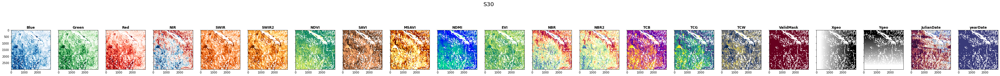

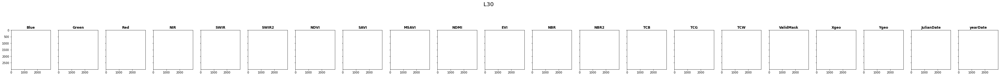

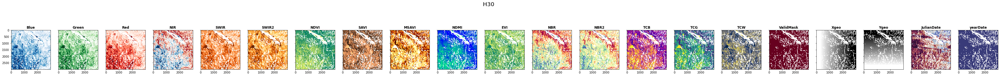

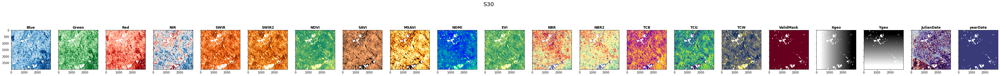

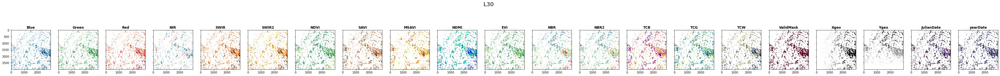

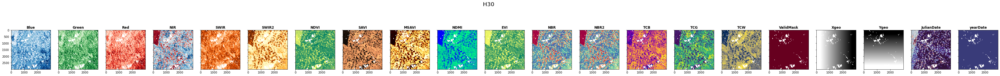

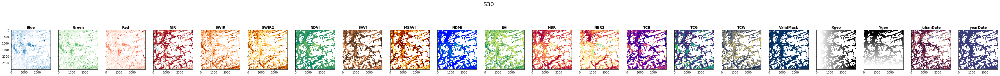

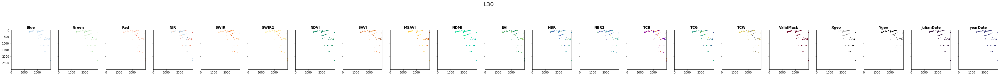

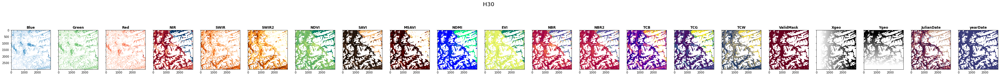

In [10]:
%%time

for TILE_NUM in TILE_NUM_LIST:
    
    for HLS_TYPE in HLS_TYPE_LIST:

        cog_fn = f'/projects/test_data/HLS_testing_fmask_v2/{HLS_TYPE}/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
        
        #print(HLS_TYPE)
        #PLOT_COMPOSITE_BANDS(cog_fn, nodatavalue, band_names, cmaps)
        COMPARE_COMPOSITE_BANDS(cog_fn, nodatavalue, band_names, cmaps)
    

500


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


50


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


CPU times: user 2min 26s, sys: 7.31 s, total: 2min 34s
Wall time: 2min 34s


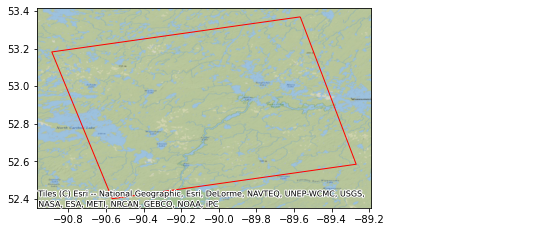

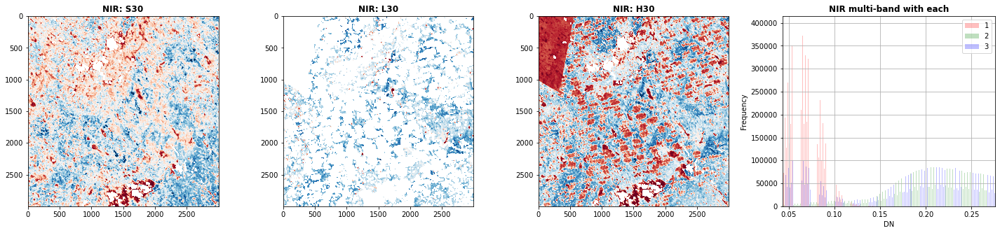

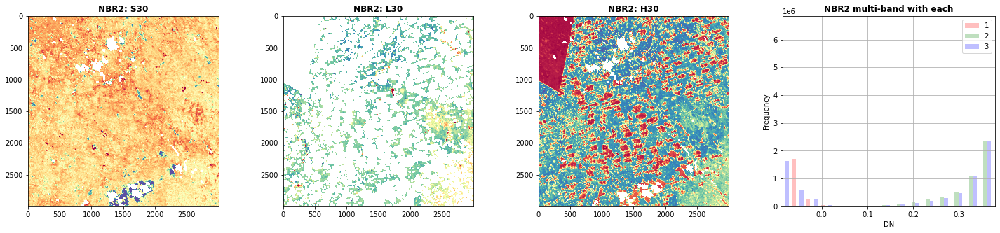

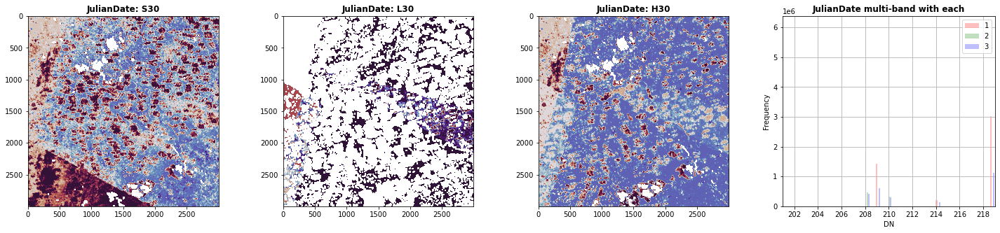

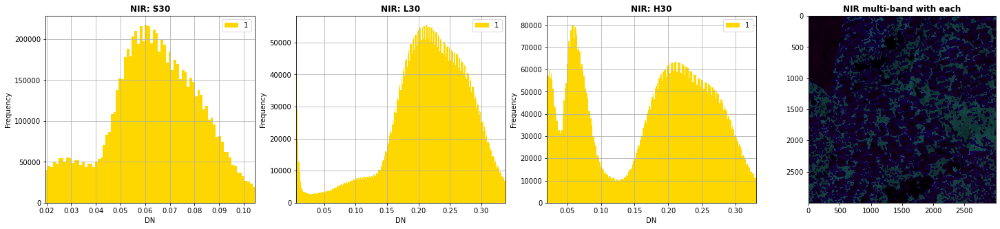

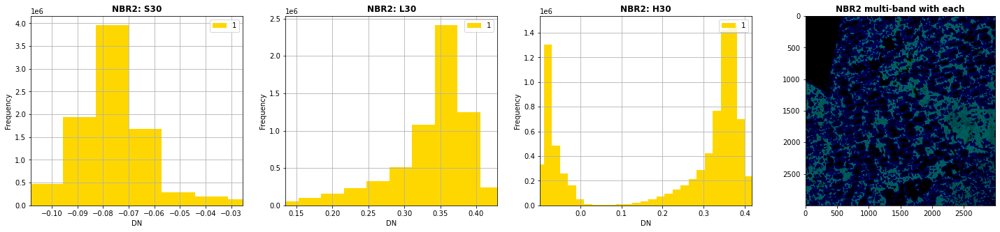

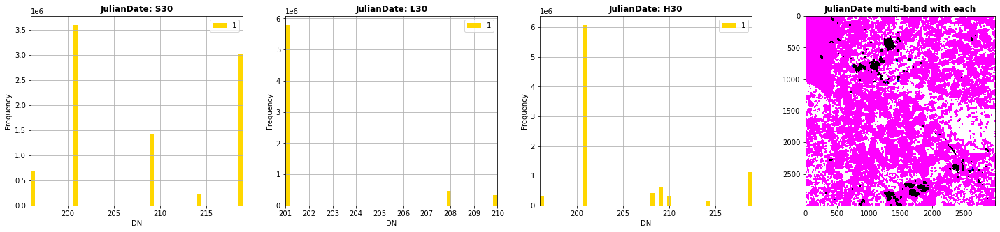

In [12]:
%%time
selected_bands = ['NIR','NBR2', 'JulianDate']

for TILE_NUM in [1858]:
    
    # Show map of TILE extent
    ax1 = boreal_tiles[boreal_tiles.tile_num == TILE_NUM].to_crs(4326).plot(facecolor='None', ec='r', label='tile_num')
    ax1 = ctx.add_basemap(ax1, crs=4326, 
            #source = ctx.providers.Esri.WorldShadedRelief
            #source = ctx.providers.Esri.WorldGrayCanvas
            source = ctx.providers.Esri.NatGeoWorldMap
            #source = ctx.providers.Esri.WorldImagery
        )
    # Tiles processed in chunk below in this notebook
    S30_cog_fn = f'/projects/test_data/HLS_testing_fmask_v2/S30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    L30_cog_fn = f'/projects/test_data/HLS_testing_fmask_v2/L30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    H30_cog_fn = f'/projects/test_data/HLS_testing_fmask_v2/H30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    
    cog_fn_list = [S30_cog_fn, L30_cog_fn, H30_cog_fn]

    #PLOT_COMPOSITE_BANDS(cog_fn, nodatavalue, band_names, cmaps)
    COMPARE_COMPOSITE_BANDS_v2(cog_fn_list, nodatavalue, band_names, cmaps, selected_names_list = selected_bands , selected_names_bins_list = [500, 5000, 50])
    COMPARE_COMPOSITE_BANDS_v3(cog_fn_list, nodatavalue, band_names, cmaps, selected_names_list = selected_bands , selected_names_bins_list = [500, 5000, 50])

__This example is for a list of HLS composite tiles from July 1 2020 - Aug 15 2020__  


In [ ]:
%%time
selected_bands = ['NIR','NBR2', 'JulianDate']

for TILE_NUM in TILE_NUM_LIST:
    
    # Show map of TILE extent
    ax1 = boreal_tiles[boreal_tiles.tile_num == TILE_NUM].to_crs(4326).plot(facecolor='None', ec='r', label='tile_num')
    ax1 = ctx.add_basemap(ax1, crs=4326, 
            #source = ctx.providers.Esri.WorldShadedRelief
            #source = ctx.providers.Esri.WorldGrayCanvas
            source = ctx.providers.Esri.NatGeoWorldMap
            #source = ctx.providers.Esri.WorldImagery
        )
    # Tiles processed in chunk below in this notebook
    S30_cog_fn = f'/projects/test_data/HLS_testing/S30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    L30_cog_fn = f'/projects/test_data/HLS_testing/L30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    H30_cog_fn = f'/projects/test_data/HLS_testing/H30/HLS_{TILE_NUM}_{STARTDATE}_08-15_2021_2021.tif'
    
    cog_fn_list = [S30_cog_fn, L30_cog_fn, H30_cog_fn]

    #PLOT_COMPOSITE_BANDS(cog_fn, nodatavalue, band_names, cmaps)
    COMPARE_COMPOSITE_BANDS_v2(cog_fn_list, nodatavalue, band_names, cmaps, selected_names_list=selected_bands , selected_names_bins_list = [500, 5000, 50] )
    COMPARE_COMPOSITE_BANDS_v3(cog_fn_list, nodatavalue, band_names, cmaps, selected_names_list=selected_bands , selected_names_bins_list = [500, 5000, 50] )
    

STARTDATE = '08-01'

## Processing

In [99]:
# These tiles had artifacts in the 2019-2021 HLS comp with L30

# 2021 is first year S30 is available it seems

# Can we improve on c2020 comps (2019-2021) with a 2021 comp using S30 & L30 for Jule-August

TILES_with_artefacts_LIST = [2181]#[3278,2995]#[1831]#[3364]#[2181]#[3946]#[2889]#[3094]#[4476]#[2889]#[2940]#[3001]#[3189]#[3664]#[3570]#[35579]#[3380]#[984]#[3656]#[1858]# [237,984,702,1858,3387]

2181 - needs much more than 40

In [103]:
MS_DATA_TYPE = 'HLS' #'LS8' # FYI non-HLS option is broken right now. Doesnt matter. Only want HLS

if MS_DATA_TYPE == 'LS8':
    SAT_API = 'https://landsatlook.usgs.gov/sat-api'
else:
    SAT_API = 'https://cmr.earthdata.nasa.gov/stac/LPCLOUD'
    
MAX_CLOUDS = 75
SEASON_START = '07-01'#'08-01'
SEASON_STOP = '08-31'
YEAR_START = '2022'
YEAR_STOP = '2022'
RUN_NAME = f'mc{MAX_CLOUDS}_{SEASON_START}_{SEASON_STOP}_{YEAR_START}_{YEAR_STOP}'
RUN_NAME

'mc75_07-01_08-31_2022_2022'

In [104]:
TEST_SUBDIR = os.path.join('HLS_testing_rangelims_red_default', str(MAX_CLOUDS))
#TEST_SUBDIR = os.path.join('HLS_testing_rangelims_red', str(MAX_CLOUDS))
RANGELIMS_RED = '0 1'
TEST_SUBDIR

'HLS_testing_rangelims_red_default/75'

##### 3.1.2_dps.py

example call:  

```python /projects/Developer/icesat2_boreal/lib/3.1.2_dps.py -i /projects/shared-buckets/nathanmthomas/boreal_tiles_v003.gpkg --composite_type HLS -lyr boreal_tiles_v003 -a https://cmr.earthdata.nasa.gov/stac/LPCLOUD --tile_buffer_m 0 --in_tile_num 984 -o /projects/test_data/HLS_testing_rangelims_red_default/25/H30 -sy 2020 -ey 2020 -smd 07-01 -emd 09-01 -mc 25 -t HLS --shape 3000 --hls_product H30```

In [105]:
for TILE_NUM in TILES_with_artefacts_LIST:

    # Loop over the HLS product here
    for HLS_PRODUCT in ['H30']:#, 'S30', 'H30']:#,'H30']:

        OUTDIR = f'/projects/test_data/{TEST_SUBDIR}/{HLS_PRODUCT}'
        !mkdir -p $OUTDIR

        args = f"-i {INDEX_FN} \
        --composite_type {MS_DATA_TYPE} \
        -lyr {'boreal_tiles_v003'} \
        -a {SAT_API} \
        --tile_buffer_m 0 \
        --in_tile_num {TILE_NUM} \
        -o {OUTDIR} \
        -sy {YEAR_START} -ey {YEAR_STOP} -smd {SEASON_START} -emd {SEASON_STOP} -mc {MAX_CLOUDS} \
        --shape 3000 \
        --hls_product {HLS_PRODUCT} \
        --rangelims_red {RANGELIMS_RED} \
        --search_only"

        #!python 3.1.2_dps.py $args
        cmd = f'python /projects/Developer/icesat2_boreal/lib/3.1.2_dps.py {args}'
        !echo $cmd
        !echo
        !eval $cmd

python /projects/Developer/icesat2_boreal/lib/3.1.2_dps.py -i /projects/shared-buckets/nathanmthomas/boreal_tiles_v003.gpkg --composite_type HLS -lyr boreal_tiles_v003 -a https://cmr.earthdata.nasa.gov/stac/LPCLOUD --tile_buffer_m 0 --in_tile_num 2181 -o /projects/test_data/HLS_testing_rangelims_red_default/75/H30 -sy 2022 -ey 2022 -smd 07-01 -emd 08-31 -mc 75 --shape 3000 --hls_product H30 --rangelims_red 0 1 --search_only

/projects/.local/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string

Tiles path:		 /projects/shared-buckets/nathanmthomas/boreal_tiles_v003.gpkg
Tile number:		 2181
Output res (m):		 30
in_bbox:		 [-3321478.0000000047, 4383304.000000009, -3231478.0000000047, 4473304.000000009]
bbox 4326:		 [101.94066128166793, 60.32222862788353, 104.1

In [86]:
import rasterio
from rasterio.plot import show_hist, show

def map_image_band(cog_fn, band_num=13, vmin=0.20, vmax=0.45):
    with rasterio.open(cog_fn) as dataset:

        fig, ax = plt.subplots(figsize=(5, 5))

        # use imshow so that we have something to map the colorbar to
        image_hidden = ax.imshow(dataset.read(band_num), 
                                 cmap='nipy_spectral', 
                                 vmin=vmin, 
                                 vmax=vmax)

        # plot on the same axis with rio.plot.show
        image = show(dataset.read(band_num), 
                              transform=dataset.transform, 
                              ax=ax, 
                              cmap='nipy_spectral', 
                              vmin=vmin, 
                              vmax=vmax)

        # add colorbar using the now hidden image
        fig.colorbar(image_hidden, ax=ax)


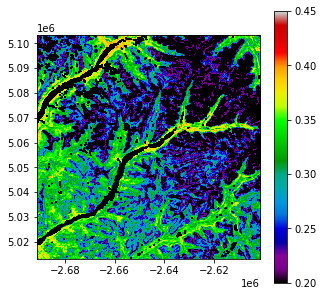

In [87]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/40/H30/HLS_1710_07-01_08-31_2022_2022.tif')

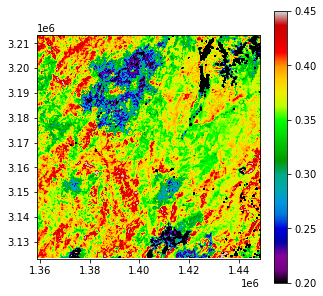

In [57]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/25/H30/HLS_3364_07-01_08-31_2022_2022.tif')

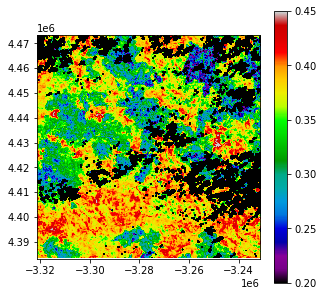

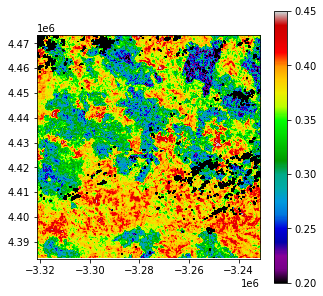

In [48]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/65/H30/HLS_2181_07-01_08-31_2022_2022.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/70/H30/HLS_2181_07-01_08-31_2022_2022.tif')

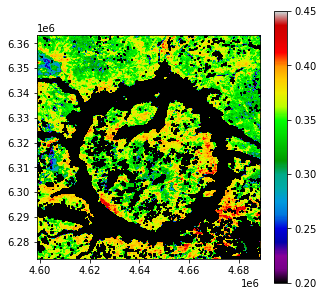

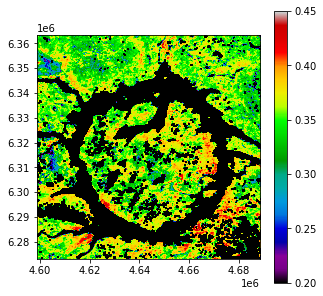

In [23]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/75/H30/HLS_936_07-01_08-31_2022_2022.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/90/H30/HLS_936_07-01_08-31_2022_2022.tif')

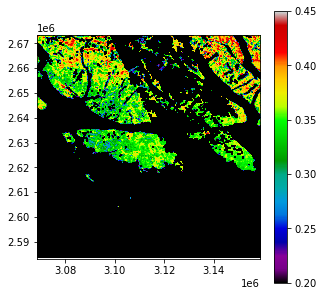

In [10]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/90/H30/HLS_3946_07-01_08-31_2020_2020.tif')

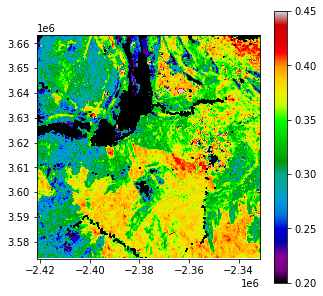

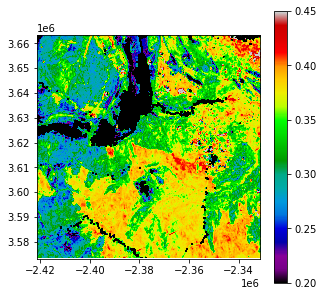

In [178]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/5/H30/HLS_2889_07-01_08-31_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/10/H30/HLS_2889_07-01_08-31_2020_2020.tif')

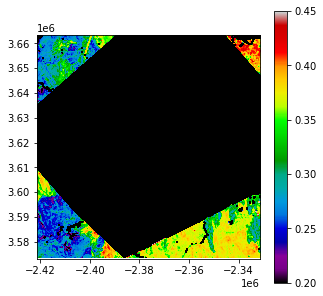

In [170]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/0/H30/HLS_2889_07-01_08-31_2020_2020.tif')

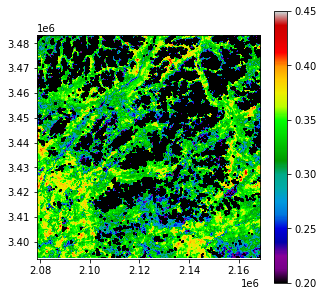

In [157]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/75/H30/HLS_3094_07-01_08-31_2020_2020.tif')

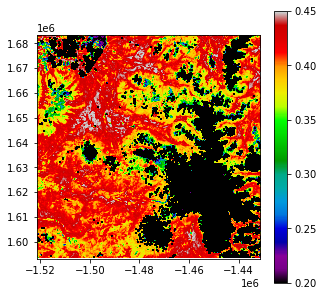

In [152]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/75/H30/HLS_4476_07-01_08-31_2020_2020.tif')

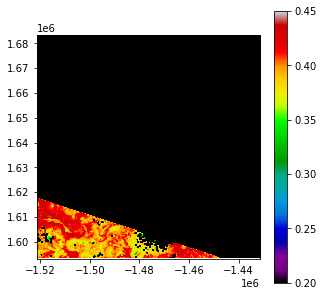

In [148]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/10/H30/HLS_4476_07-01_08-31_2020_2020.tif')

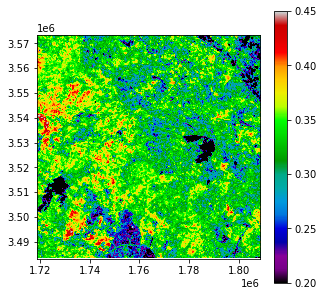

In [128]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/90/H30/HLS_3001_06-15_09-15_2020_2020.tif')

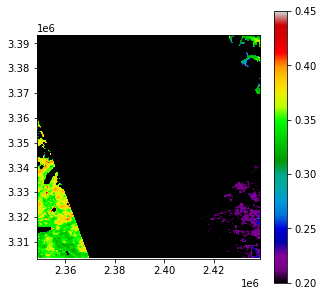

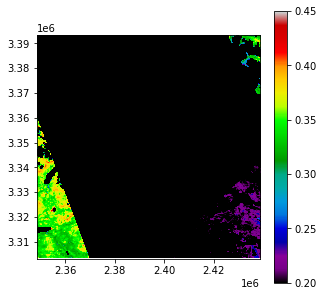

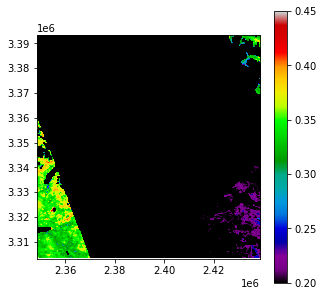

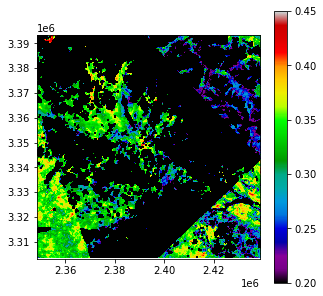

In [119]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/45/H30/HLS_3189_06-15_09-15_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/55/H30/HLS_3189_06-15_09-15_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/60/H30/HLS_3189_06-15_09-15_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/75/H30/HLS_3189_06-15_09-15_2020_2020.tif')

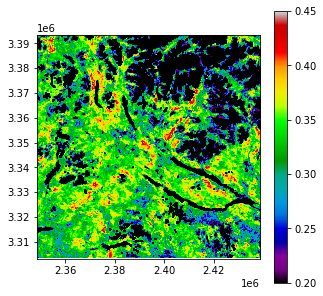

In [123]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/90/H30/HLS_3189_06-15_09-15_2020_2020.tif')

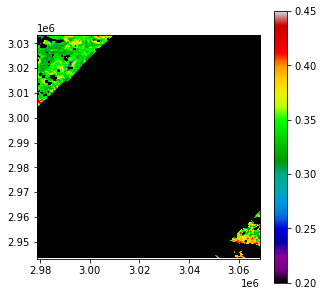

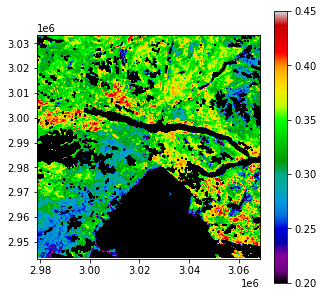

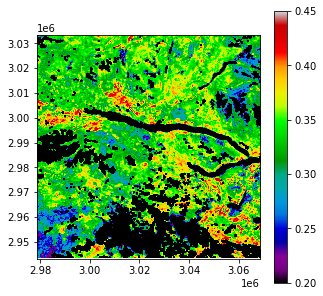

In [90]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/25/H30/HLS_3570_07-01_08-31_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/35/H30/HLS_3570_07-01_08-31_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/45/H30/HLS_3570_07-01_08-31_2020_2020.tif')

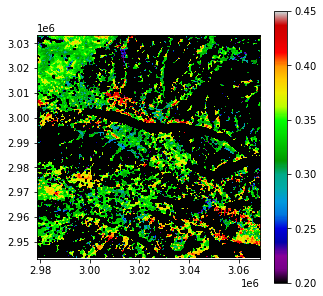

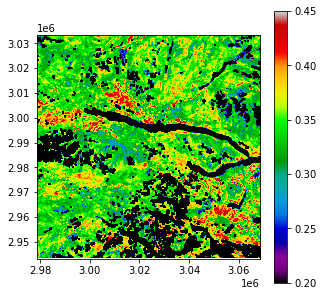

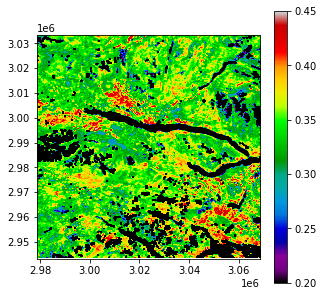

In [96]:
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/25/H30/HLS_3570_06-15_09-15_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/35/H30/HLS_3570_06-15_09-15_2020_2020.tif')
map_image_band('/projects/test_data/HLS_testing_rangelims_red_default/45/H30/HLS_3570_06-15_09-15_2020_2020.tif')